## SPRINT 05 TASCA 02 Train test

Exercicis de Train-Test amb ScikitLearn a partir d'un dataset amb informació sobre les vivendes de Houston.


- **Exercici 1**

    - Parteix el conjunt de dades adjunt en train i test. Estudia els dos conjunts per separat, a nivell descriptiu.

    - També adjunt trobaràs una descripció de les diferents variables del dataset.


- **Exercici 2**

    - Aplica algun procés de transformació (estandarditzar les dades numèriques, crear columnes dummies, polinomis...).


- **Exercici 3**

    - Resumeix les noves columnes generades de manera estadística i gràfica


In [1]:
# importing libraries
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib_inline
from IPython.display import Image ##use the IPython Image object to display an Image
##To Plot interactively within an IPython notebook
%matplotlib inline 
from IPython.display import Image ##use the IPython Image object to display an Image

from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

## Warnings dealing
#import warnings
#warnings.filterwarnings('ignore')

### Exercici 1

<div class="alert alert-block alert-info">

- Parteix el conjunt de dades adjunt en train i test. Estudia els dos conjunts per separat, a nivell descriptiu.

- També adjunt trobaràs una descripció de les diferents variables del dataset.
</div>

- Comencem mirant carregant i mirant el dataframe

In [2]:
df = pd.read_csv("housing data.csv", header=None) ## with header=Non, pandas assigns an index
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273.0,21.0,393.45,6.48,22.0


- Com que el dataframe no te el nom de les columnes, les afegim. Els noms venen de l'arxiu housing data description.

- **Attribute Information:**

    1. **CRIM:**      per capita crime rate by town
    2. **ZN:**        proportion of residential land zoned for lots over 25,000 sq.ft.
    3. **INDUS:**     proportion of non-retail business acres per town
    4. **CHAS:**      Charles River dummy variable (= 1 if tract boundsriver; 0 otherwise)
    5. **NOX:**       nitric oxides concentration (parts per 10 million)
    6. **RM:**        average number of rooms per dwelling
    7. **AGE:**       proportion of owner-occupied units built prior to 1940
    8. **DIS:**       weighted distances to five Boston employment centres
    9. **RAD:**       index of accessibility to radial highways
    10. **TAX:**      full-value property-tax rate per 10,000 dolars
    11. **PTRATIO:**  pupil-teacher ratio by town
    12. **B:**        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
    13. **LSTAT:**    % lower status of the population
    14. **MEDV:**     Median value of owner-occupied homes in 1000's dolars

In [3]:
## Change column names
columNames = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
df.columns = columNames
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273.0,21.0,393.45,6.48,22.0


- Fem unes primeres observacions estadistiques del data set.
- Mirem la correlació amb la matriu de correlació, heatmap i 
- visualitzem un pairplot per veure, en general la distribució de les dades

In [6]:
df.describe().round(3)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000,506.000
mean,3.614,11.364,11.137,0.069,0.555,6.285,68.575,3.795,9.549,408.237,18.456,356.674,12.653,22.533
std,8.602,23.322,6.860,0.254,0.116,0.703,28.149,2.106,8.707,168.537,2.165,91.295,7.141,9.197
min,0.006,0.000,0.460,0.000,0.385,3.561,2.900,1.130,1.000,187.000,12.600,0.320,1.730,5.000
25%,0.082,0.000,5.190,0.000,0.449,5.885,45.025,2.100,4.000,279.000,17.400,375.378,6.950,17.025
50%,0.257,0.000,9.690,0.000,0.538,6.208,77.500,3.207,5.000,330.000,19.050,391.440,11.360,21.200
75%,3.677,12.500,18.100,0.000,0.624,6.624,94.075,5.188,24.000,666.000,20.200,396.225,16.955,25.000
max,88.976,100.000,27.740,1.000,0.871,8.780,100.000,12.126,24.000,711.000,22.000,396.900,37.970,50.000


In [17]:
df.isna().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

In [18]:
df.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

- No sobserven nulls ni NaNs al data set.

In [8]:
df.corr()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


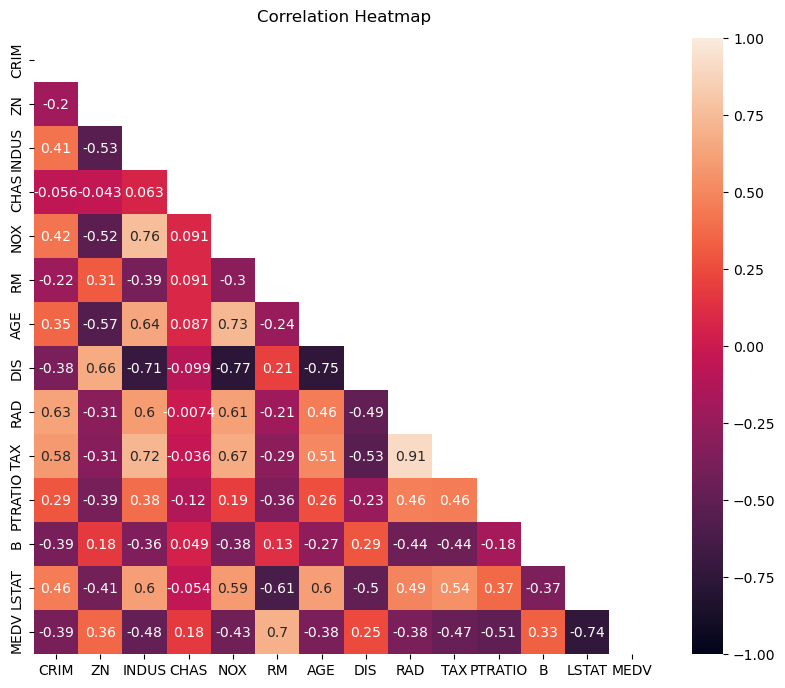

In [9]:
##Figure size:
plt.figure(figsize=(10,8))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df.corr()))
## from https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e
heatmap = sns.heatmap(df.corr(), mask=mask, vmin=-1, vmax=1, annot=True);
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

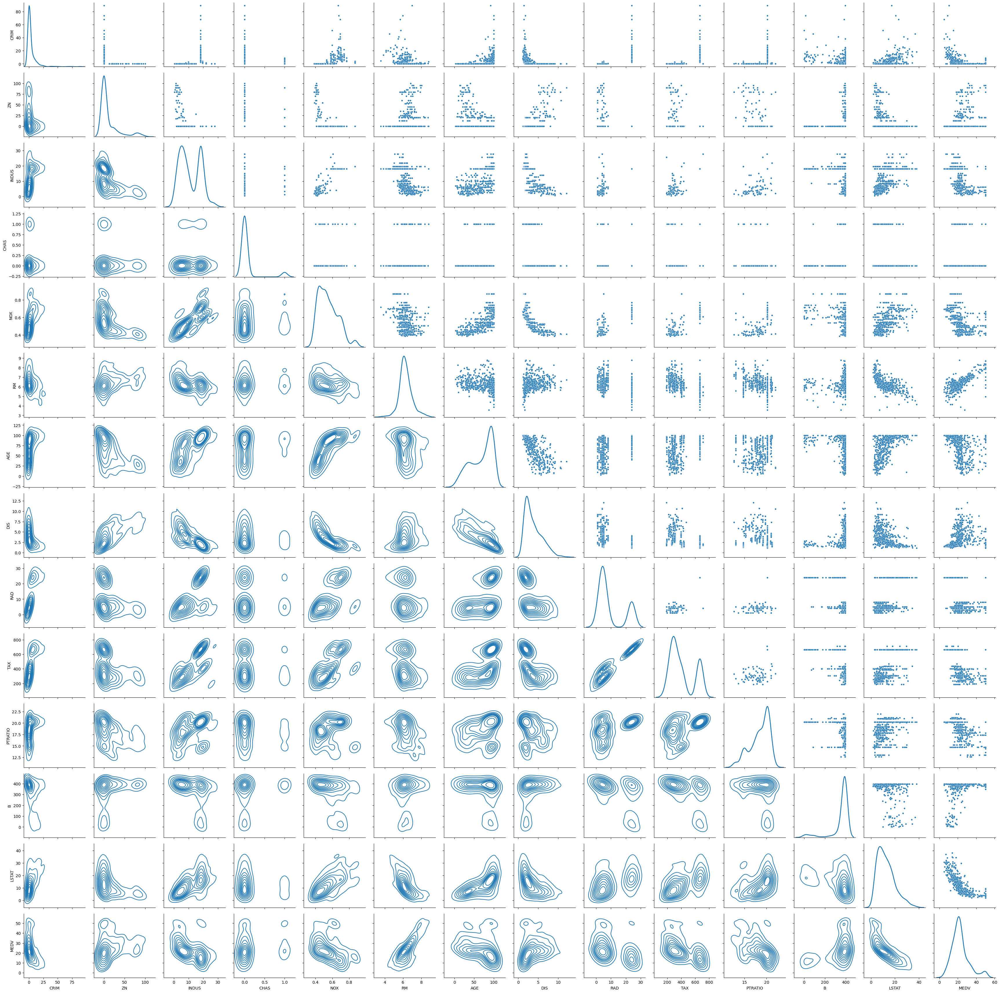

In [10]:
g = sns.PairGrid(df, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)

plt.savefig('DensityCorrelationGrid_Allvariables.jpg')
plt.show()

- Clarament observem que hi ha variables amb correlacions positives i negatives
- Veiem que la majoria de distribucions NO són normals.



- Comencem fen la separació de les dades en train-test:
    - Escullo separar les dades en 80% pel train i 20% pel test
    - A més a més, santerirorment he probat la seed 42 i m'he trobat amb diversos problemes comparant el train i el test. On em sortia que algunes variables no presentaven la mateixa distribució amb eñ train i amb el test. He probat una altre seed (4) i ara sembla que funciona millor.
   

In [11]:
# split into train test sets
train, test = train_test_split(df, test_size=0.20, random_state=4)

In [12]:
train.describe().round(3)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,404.000,404.000,404.000,404.000,404.000,404.000,404.000,404.000,404.000,404.000,404.000,404.000,404.000,404.000
mean,3.714,10.996,11.085,0.062,0.557,6.272,68.894,3.788,9.785,413.092,18.474,357.851,12.788,22.298
std,8.497,22.942,6.870,0.241,0.118,0.712,28.096,2.135,8.818,170.054,2.171,89.476,7.225,9.067
min,0.006,0.000,0.740,0.000,0.385,3.561,2.900,1.130,1.000,187.000,12.600,0.320,1.730,5.000
25%,0.080,0.000,5.130,0.000,0.449,5.886,45.675,2.088,4.000,281.000,17.375,375.085,7.170,16.575
50%,0.263,0.000,9.690,0.000,0.538,6.208,77.500,3.142,5.000,334.500,19.100,391.260,11.395,21.300
75%,3.897,12.500,18.100,0.000,0.647,6.607,93.925,5.141,24.000,666.000,20.200,396.157,17.105,24.850
max,88.976,100.000,27.740,1.000,0.871,8.780,100.000,12.126,24.000,711.000,22.000,396.900,37.970,50.000


In [14]:
test.describe().round(3)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,102.000,102.000,102.000,102.000,102.000,102.000,102.000,102.000,102.000,102.000,102.000,102.000,102.000,102.000
mean,3.214,12.819,11.340,0.098,0.545,6.334,67.310,3.824,8.618,389.010,18.384,352.013,12.118,23.462
std,9.035,24.838,6.852,0.299,0.109,0.664,28.461,1.995,8.228,161.769,2.150,98.496,6.806,9.686
min,0.013,0.000,0.460,0.000,0.392,4.903,6.600,1.332,1.000,188.000,13.000,6.680,2.470,6.300
25%,0.091,0.000,6.200,0.000,0.449,5.881,42.350,2.203,4.000,277.000,17.400,375.668,6.345,17.575
50%,0.235,0.000,9.900,0.000,0.524,6.226,77.250,3.395,5.000,307.000,18.600,392.760,11.285,20.500
75%,1.965,16.250,18.100,0.000,0.605,6.716,94.400,5.203,8.000,437.000,20.200,396.238,16.008,27.875
max,73.534,95.000,27.740,1.000,0.871,8.337,100.000,9.223,24.000,711.000,21.200,396.900,29.970,50.000


- Veiem que en general són molt semblants estadisticament.



- Faig un Pairplot pel train i un pel test per veure si visualment són iguals:

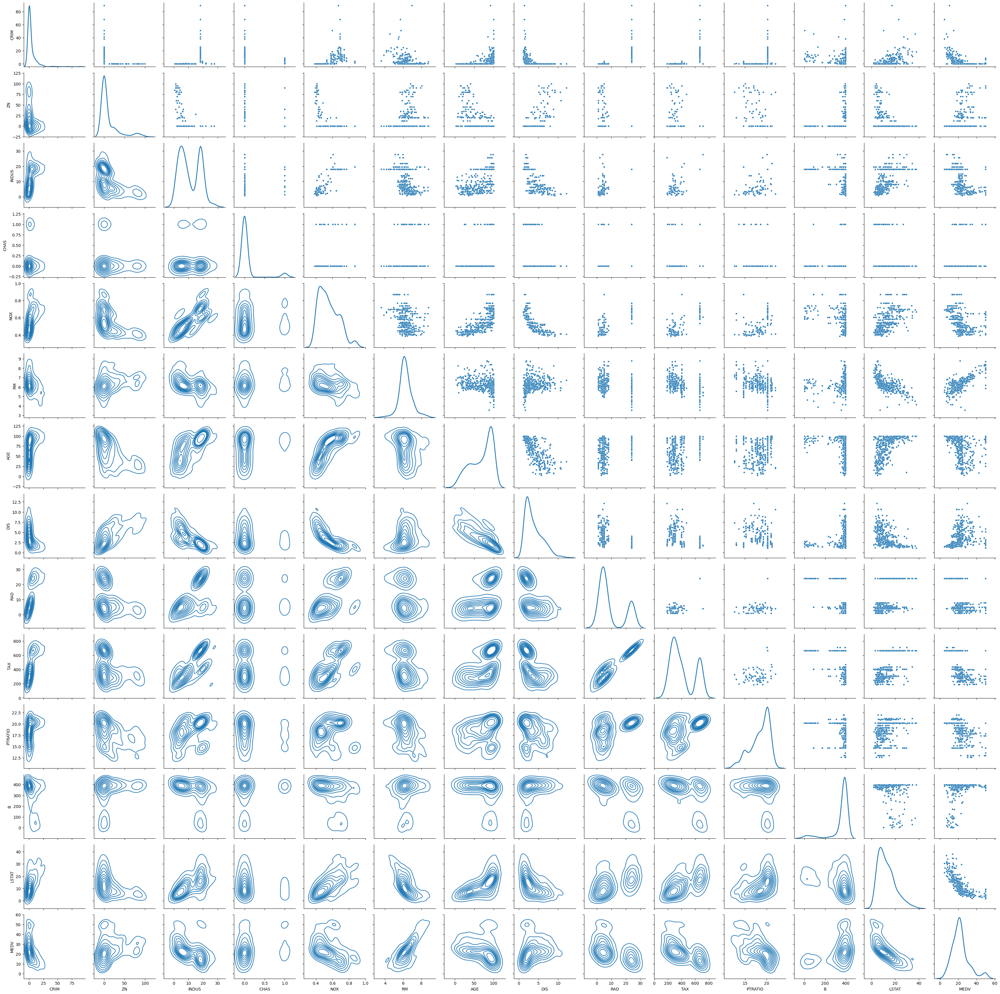

In [15]:
g = sns.PairGrid(train, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)

plt.show()

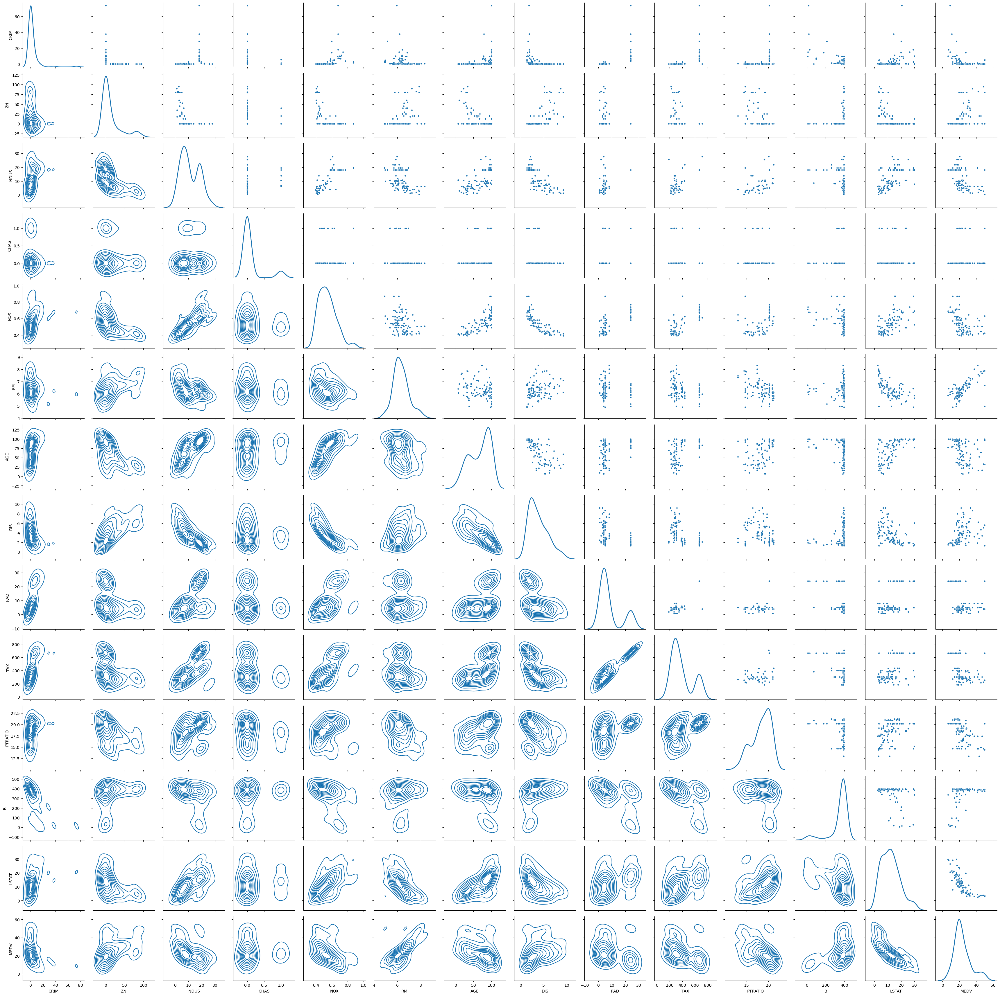

In [16]:
g = sns.PairGrid(test, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)

plt.show()

- Visualment són força similars
- Anem a testejar algunes de les variables estadisticament
- També mirarem amb hipothesis testing si son les dues normabls, variances semblants..etc

In [19]:
# Define a function to check normality
## For checking normality, I used Shapiro-Wilk’s W test which is generally preferred for 
## smaller samples however there are other options like Kolmogorov-Smirnov and D’Agostino and Pearson’s test. 
def check_normality(data):
    test_stat_normality, p_value_normality=stats.shapiro(data)
    print("p value:%.6f" % p_value_normality)
    if p_value_normality <0.05:
        print("Reject null hypothesis >> The data is not normally distributed")
    else:
        print("Fail to reject null hypothesis >> The data is normally distributed")
        
## Define a function to check variance
## For checking variance homogeneity, I preferred Levene’s test  
## but you can also check Bartlett’s test
def check_variance_homogeneity(group1, group2):
    test_stat_var, p_value_var= stats.levene(group1,group2)
    print("p value:%.4f" % p_value_var)
    if p_value_var <0.05:
        print("Reject null hypothesis >> The variances of the samples are different.")
    else:
        print("Fail to reject null hypothesis >> The variances of the samples are same.")

- Agafem columnes random per xeckejar

In [20]:
check_normality(train['CRIM'])
check_normality(test['CRIM'])

p value:0.000000
Reject null hypothesis >> The data is not normally distributed
p value:0.000000
Reject null hypothesis >> The data is not normally distributed


In [21]:
check_variance_homogeneity(train['CRIM'], test['CRIM'])

p value:0.5983
Fail to reject null hypothesis >> The variances of the samples are same.


- Veiem que tant el train com el test no son normals pero tenen les variances semblants

- Busquem un test per dades No parametriques per mirar si les mitjanes s'assemblen:

- Aplioquem test Manwhaite U-test

In [22]:
ttest,pvalue = stats.mannwhitneyu(train['CRIM'], test['CRIM'])
print("p-value:%.4f" % pvalue)
if pvalue > 0.05:
    print('Probably the same distribution')
else:
    print('Probably different distributions')

p-value:0.4814
Probably the same distribution


- I ens corrobora que probablemanet és la mateixa distribució

- Agafem la columna 5 que semblen normals i ho comprovem:

In [23]:
check_normality(train['NOX'])
check_normality(test['NOX'])

p value:0.000000
Reject null hypothesis >> The data is not normally distributed
p value:0.000079
Reject null hypothesis >> The data is not normally distributed


In [24]:
check_variance_homogeneity(train['NOX'], test['NOX'])

p value:0.1704
Fail to reject null hypothesis >> The variances of the samples are same.


In [25]:
ttest,pvalue = stats.mannwhitneyu(train['NOX'], test['NOX'])
print("p-value:%.4f" % pvalue)
if pvalue > 0.05:
    print('Probably the same distribution')
else:
    print('Probably different distributions')

p-value:0.4514
Probably the same distribution


- Doncs aquesta columna podem veure que amb un alpha 0.05 no són normals tampoc tot i que visualment ho semblessin.
- Tot i que veiem que tenen les variances semblants i son disatribucions semblants. Sempre amb un alpha de 0.05


- Agafem una altre columna

In [26]:
check_normality(train['PTRATIO'])
check_normality(test['PTRATIO'])

p value:0.000000
Reject null hypothesis >> The data is not normally distributed
p value:0.000005
Reject null hypothesis >> The data is not normally distributed


In [27]:
check_variance_homogeneity(train['PTRATIO'], test['PTRATIO'])

p value:0.9610
Fail to reject null hypothesis >> The variances of the samples are same.


In [28]:
ttest,pvalue = stats.mannwhitneyu(train['PTRATIO'], test['PTRATIO'])
print("p-value:%.4f" % pvalue)
if pvalue > 0.05:
    print('Probably the same distribution')
else:
    print('Probably different distributions')

p-value:0.6341
Probably the same distribution


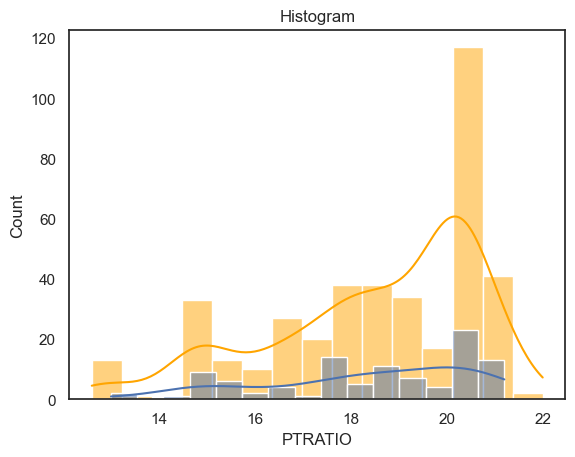

In [30]:
sns.set_theme(style="white")
sns.histplot(data=train, x=train['PTRATIO'], bins=15, color='orange', kde= True)
sns.histplot(data=test, x=test['PTRATIO'], bins=15, kde= True)
plt.title("Histogram");

- En aquest cas també veiem que tot i no ser normals probablament son la mateixa distribucion.


- Prebiament havia fet el train-test amb la seed 42. i aquesta columna sortia que probablament eren distribucions diferents. Al fer el canvi de seed veim que ara si que són semblants.
- Aquestes coses poden passar segons on comencem el random, i la alteoritat. 
    - Podem mirar de canviar de seed
    - També podem mirar de canviar l'apha en algunes ocasions i especificar-ho.
    - També es podria primer fer un shaffle i seguir agafant la mateixa seeg a veure si axií millorès.
    - Però tot depen molt de les dades i el que es vulgui fer.

### Exercici 2

<div class="alert alert-block alert-info">
- Aplica algun procés de transformació (estandarditzar les dades numèriques, crear columnes dummies, polinomis...).
</div>

- El preprocessat de les dades l'aplicarem a grup de train.


- Com que no tenim dades categoriques, no te molt sentit fer Dummies.

- En el cas de les dades numèriques que tenim varies opcions:
    - Dades Normals --> NORMALITZACIÓ de 0 a 1 i si hi ha negatius de -1 a 1.
    - No Normals: 
        - Sense Outliers: Standarització de 0 a 1 i si hi ha negatius de -1 a 1.
        - Amb outliers: Standarització amb Robust Scaled que te en compte els outliers
 
 
        
- Com ja s'ha vist, sembla que la majoria de les nostres dades no tenen una distribució normal, així que haurem de mirar si tnene outliers o no i porcedir en consequencia.


- Pupil teacher Ratio ja és una variable de ratio, és a dir és un 100%. Per tant, el que vull fer és posarla de 0 a 1 en ves de 0 a 100, simplement haig de dividir per 100


In [31]:
train['PTRATIO_0_1'] = train['PTRATIO']/100
train 

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,PTRATIO_0_1
192,0.08664,45.0,3.44,0,0.437,7.178,26.3,6.4798,5,398.0,15.2,390.49,2.87,36.4,0.152
138,0.24980,0.0,21.89,0,0.624,5.857,98.2,1.6686,4,437.0,21.2,392.04,21.32,13.3,0.212
251,0.21409,22.0,5.86,0,0.431,6.438,8.9,7.3967,7,330.0,19.1,377.07,3.59,24.8,0.191
13,0.62976,0.0,8.14,0,0.538,5.949,61.8,4.7075,4,307.0,21.0,396.90,8.26,20.4,0.210
256,0.01538,90.0,3.75,0,0.394,7.454,34.2,6.3361,3,244.0,15.9,386.34,3.11,44.0,0.159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,16.81180,0.0,18.10,0,0.700,5.277,98.1,1.4261,24,666.0,20.2,396.90,30.81,7.2,0.202
197,0.04666,80.0,1.52,0,0.404,7.107,36.6,7.3090,2,329.0,12.6,354.31,8.61,30.3,0.126
439,9.39063,0.0,18.10,0,0.740,5.627,93.9,1.8172,24,666.0,20.2,396.90,22.88,12.8,0.202
174,0.08447,0.0,4.05,0,0.510,5.859,68.7,2.7019,5,296.0,16.6,393.23,9.64,22.6,0.166


- Agafem un altre columna (MEDV)
- És la que hem fet abans aixi que ja sabem que no és normal
- Miro la distribució
- Miro si te molts outliers

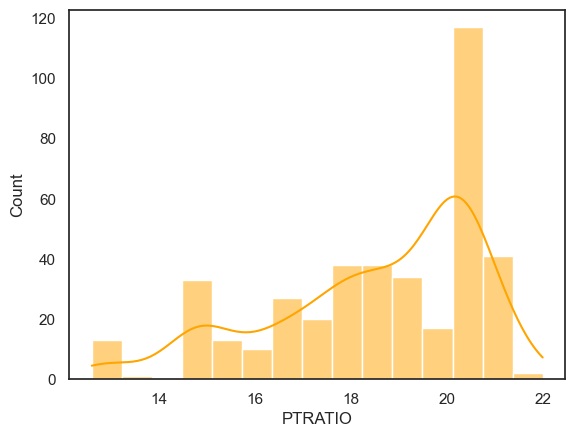

In [33]:
sns.histplot(data=train, x=train['PTRATIO'], bins=15, color='orange', kde= True);

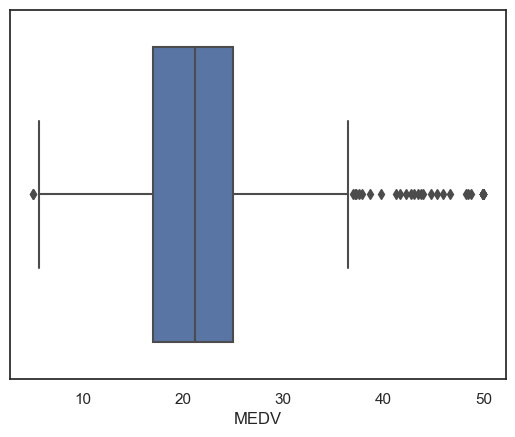

In [35]:
sns.boxplot(x=df["MEDV"]);

- Veiem que té forces outliers, així que farem un robust scaled

<AxesSubplot:>

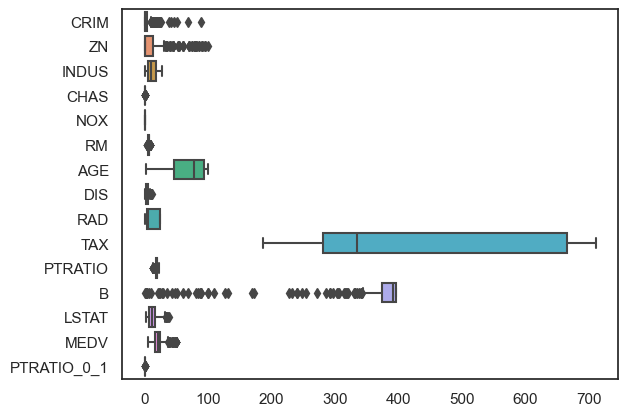

In [62]:
sns.boxplot(data=train, orient='h')


In [64]:
transformer = preprocessing.RobustScaler()
train[['MEDV']] = transformer.fit_transform(train[['MEDV']])
train


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,PTRATIO_0_1
192,0.08664,45.0,3.44,0,0.437,7.178,26.3,6.4798,5,398.0,15.2,390.49,2.87,1.824773,0.152
138,0.24980,0.0,21.89,0,0.624,5.857,98.2,1.6686,4,437.0,21.2,392.04,21.32,-0.966767,0.212
251,0.21409,22.0,5.86,0,0.431,6.438,8.9,7.3967,7,330.0,19.1,377.07,3.59,0.422961,0.191
13,0.62976,0.0,8.14,0,0.538,5.949,61.8,4.7075,4,307.0,21.0,396.90,8.26,-0.108761,0.210
256,0.01538,90.0,3.75,0,0.394,7.454,34.2,6.3361,3,244.0,15.9,386.34,3.11,2.743202,0.159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,16.81180,0.0,18.10,0,0.700,5.277,98.1,1.4261,24,666.0,20.2,396.90,30.81,-1.703927,0.202
197,0.04666,80.0,1.52,0,0.404,7.107,36.6,7.3090,2,329.0,12.6,354.31,8.61,1.087613,0.126
439,9.39063,0.0,18.10,0,0.740,5.627,93.9,1.8172,24,666.0,20.2,396.90,22.88,-1.027190,0.202
174,0.08447,0.0,4.05,0,0.510,5.859,68.7,2.7019,5,296.0,16.6,393.23,9.64,0.157100,0.166


- També faré una binarització de tot el train data set

In [67]:
columnsTrain = train.columns
binarizer = preprocessing.Binarizer(threshold=0.0).fit(train.to_numpy())
binaryTrain = binarizer.transform(train.to_numpy())
# summarize transformed data
binaryTrain = pd.DataFrame(binaryTrain, columns=columnsTrain)
binaryTrain

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,PTRATIO_0_1
0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
2,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
4,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
400,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
401,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
402,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


### Exercici 3

<div class="alert alert-block alert-info">
- Resumeix les noves columnes generades de manera estadística i gràfica
</div>

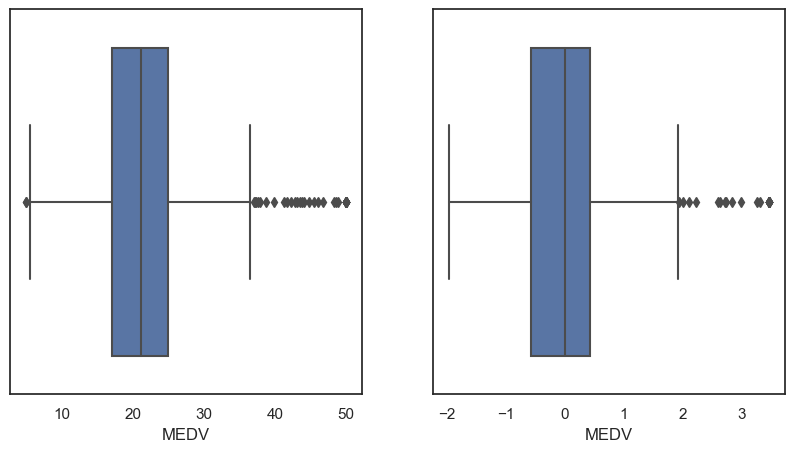

In [76]:
fig, axes = plt.subplots(1,2, figsize = (10,5))
sns.boxplot(ax=axes[0], x=df["MEDV"])
sns.boxplot(ax=axes[1], x=train["MEDV"], );

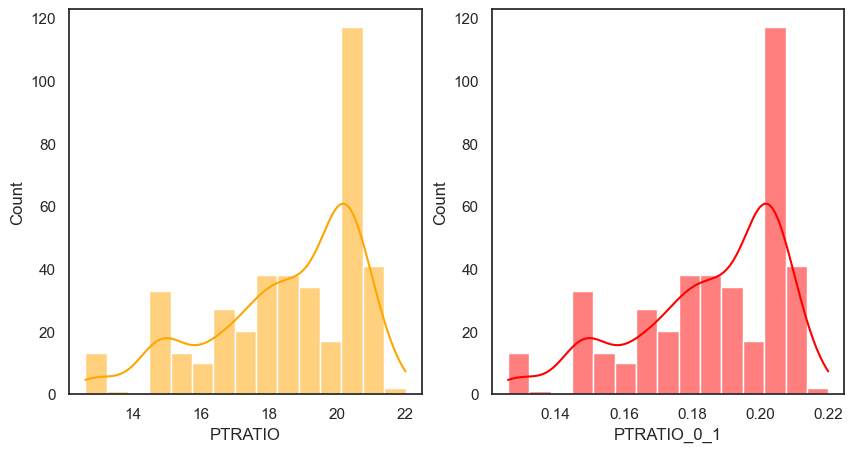

In [74]:
fig, axes = plt.subplots(1,2, figsize = (10,5))
sns.histplot(ax=axes[0], data=train, x=train['PTRATIO'], bins=15, color='orange', kde= True)
sns.histplot(ax=axes[1], data=train, x=train['PTRATIO_0_1'], bins=15, color='red', kde= True);


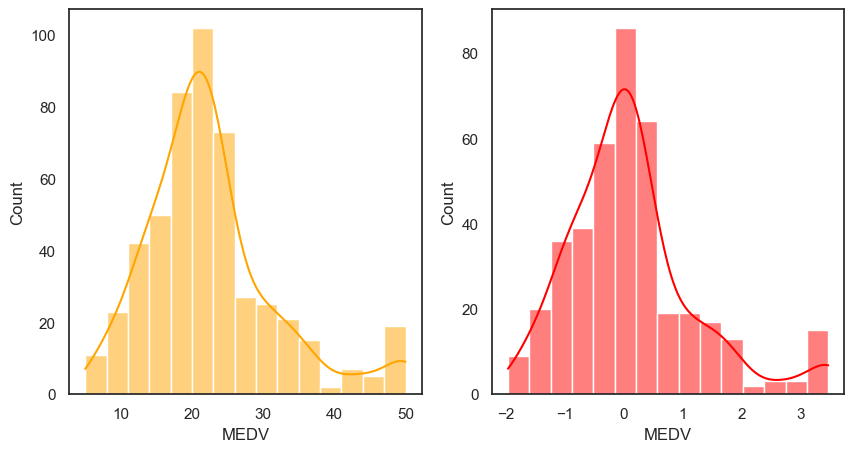

In [75]:
fig, axes = plt.subplots(1,2, figsize = (10,5))
sns.histplot(ax=axes[0], data=train, x=df['MEDV'], bins=15, color='orange', kde= True)
sns.histplot(ax=axes[1], data=train, x=train['MEDV'], bins=15, color='red', kde= True);